## Load Dataset

In [1]:
import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)
import os
import matplotlib.pyplot as plt

plt.style.use("dark_background")
plt.rcParams['figure.figsize'] = (20, 10)
pd.set_option("display.max_columns", None)

renamed_columns_en = ['date','hour','total precipitation (mm)', 'atmospheric pressure at station level (mb)','atmospheric pressure max. in the previous hour (mb)','atmospheric pressure min. in the previous hour (mb)','radiation (kj/m2)','air temperature - dry bulb (°c)','dew point temperature (°c)','max. temperature in the previous hour (°c)','min. temperature in the previous hour (°c)','dew temperature max. in the previous hour (°c)','dew temperature min. in the previous hour (°c)','relative humidity max. in the previous hour (%)','relative humidity min. in the previous hour (%)','air relative humidity (%)','wind direction (° (gr))','wind rajada maxima (m/s)','wind speed (m/s)','region','state','station','station_code','latitude','longitude','height']
df = pd.read_csv('../input/hourly-weather-surface-brazil-southeast-region/north.csv').iloc[:, 1:]
# rename columns
df.columns = renamed_columns_en
# convert into datetime
df['date_time'] = pd.to_datetime(df['date'] + ' ' +  df['hour'])
# set date_time column as index
df.set_index("date_time", inplace=True)
df.drop(columns=["region", "state", "station", "date", "hour"], inplace=True)

df.head()

,total precipitation (mm),atmospheric pressure at station level (mb),atmospheric pressure max. in the previous hour (mb),atmospheric pressure min. in the previous hour (mb),radiation (kj/m2),air temperature - dry bulb (°c),dew point temperature (°c),max. temperature in the previous hour (°c),min. temperature in the previous hour (°c),dew temperature max. in the previous hour (°c),dew temperature min. in the previous hour (°c),relative humidity max. in the previous hour (%),relative humidity min. in the previous hour (%),air relative humidity (%),wind direction (° (gr)),wind rajada maxima (m/s),wind speed (m/s),station_code,latitude,longitude,height
date_time,,,,,,,,,,,,,,,,,,,,,
2000-05-09 00:00:00,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999,-9999,-9999,-9999.0,-9999.0,A101,-3.103333,-60.016389,61.25
2000-05-09 01:00:00,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999,-9999,-9999,-9999.0,-9999.0,A101,-3.103333,-60.016389,61.25
2000-05-09 02:00:00,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999,-9999,-9999,-9999.0,-9999.0,A101,-3.103333,-60.016389,61.25
2000-05-09 03:00:00,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999,-9999,-9999,-9999.0,-9999.0,A101,-3.103333,-60.016389,61.25
2000-05-09 04:00:00,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999.0,-9999,-9999,-9999,-9999,-9999.0,-9999.0,A101,-3.103333,-60.016389,61.25


## Observe Missing Values

In [2]:
uniq_category = [sorted(df.iloc[:, i].unique()) for i in range(df.shape[1])]
uniq_category = pd.DataFrame({"kolom":df.columns,"unique":uniq_category,"count":list(map(len,uniq_category))})
uniq_category

,kolom,unique,count
0,total precipitation (mm),"[-9999.0, 0.0, 0.2, 0.4, 0.6, 0.8, 1.0, 1.2, 1...",386
1,atmospheric pressure at station level (mb),"[-9999.0, 852.1, 852.9, 853.2, 854.4, 855.2, 8...",1489
2,atmospheric pressure max. in the previous hour...,"[-9999.0, 832.0, 836.5, 837.8, 840.1, 840.8, 8...",1494
3,atmospheric pressure min. in the previous hour...,"[-9999.0, 830.1, 831.0, 831.1, 832.2, 833.7, 8...",1501
4,radiation (kj/m2),"[-9999, 0, 1, 2, 3, 4, 5, 6, 7, 8, 9, 10, 11, ...",23702
5,air temperature - dry bulb (°c),"[-9999.0, -9.0, -5.0, -2.3, 0.0, 0.8, 2.0, 2.2...",373
6,dew point temperature (°c),"[-9999.0, -10.0, -9.9, -9.8, -9.7, -9.6, -9.5,...",496
7,max. temperature in the previous hour (°c),"[-9999.0, 0.0, 2.0, 2.5, 2.7, 4.4, 5.0, 5.2, 6...",385
8,min. temperature in the previous hour (°c),"[-9999.0, -5.6, -5.0, -2.4, -0.2, 0.0, 0.2, 1....",381
9,dew temperature max. in the previous hour (°c),"[-9999.0, -10.0, -9.9, -9.8, -9.7, -9.6, -9.5,...",522


### Terlihat bahwa banyak data adalah -9999 dimana sangat tidak masuk akal, maka kita akan menandainya sebagai data missing


In [3]:
df.replace(-9999.0, np.nan, inplace=True)
df.isnull().sum()

total precipitation (mm)                               1988221
atmospheric pressure at station level (mb)             1591222
atmospheric pressure max. in the previous hour (mb)    1597892
atmospheric pressure min. in the previous hour (mb)    1597871
radiation (kj/m2)                                      4540804
air temperature - dry bulb (°c)                        1551208
dew point temperature (°c)                             1706311
max. temperature in the previous hour (°c)             1558370
min. temperature in the previous hour (°c)             1558241
dew temperature max. in the previous hour (°c)         1713899
dew temperature min. in the previous hour (°c)         1715709
relative humidity max. in the previous hour (%)        1707478
relative humidity min. in the previous hour (%)        1711836
air relative humidity (%)                              1706495
wind direction (° (gr))                                1847536
wind rajada maxima (m/s)                               

In [4]:
# remove 21 row pertama yang semuanya nan (agar bisa diinterpolate)
df = df.iloc[21:]
df.isna().sum()

total precipitation (mm)                               1988200
atmospheric pressure at station level (mb)             1591201
atmospheric pressure max. in the previous hour (mb)    1597871
atmospheric pressure min. in the previous hour (mb)    1597850
radiation (kj/m2)                                      4540783
air temperature - dry bulb (°c)                        1551187
dew point temperature (°c)                             1706290
max. temperature in the previous hour (°c)             1558349
min. temperature in the previous hour (°c)             1558220
dew temperature max. in the previous hour (°c)         1713878
dew temperature min. in the previous hour (°c)         1715688
relative humidity max. in the previous hour (%)        1707457
relative humidity min. in the previous hour (%)        1711815
air relative humidity (%)                              1706474
wind direction (° (gr))                                1847515
wind rajada maxima (m/s)                               

## Visualisasi Data Sebelum Preprocess

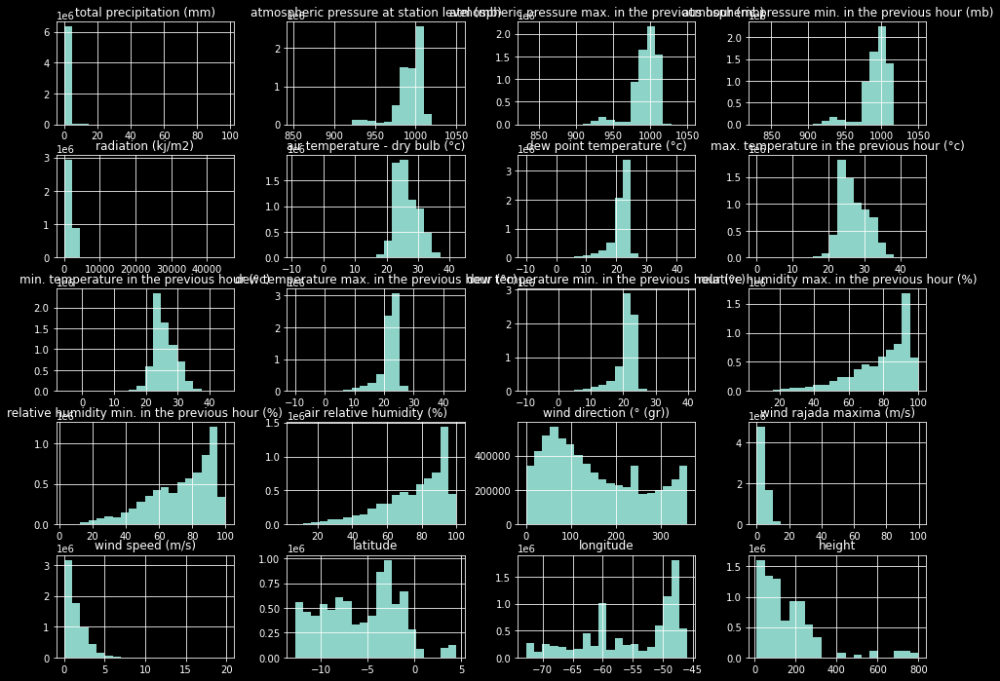

In [5]:
df.hist(figsize=(16,12), bins=20)
plt.show()

## Imputasi Data

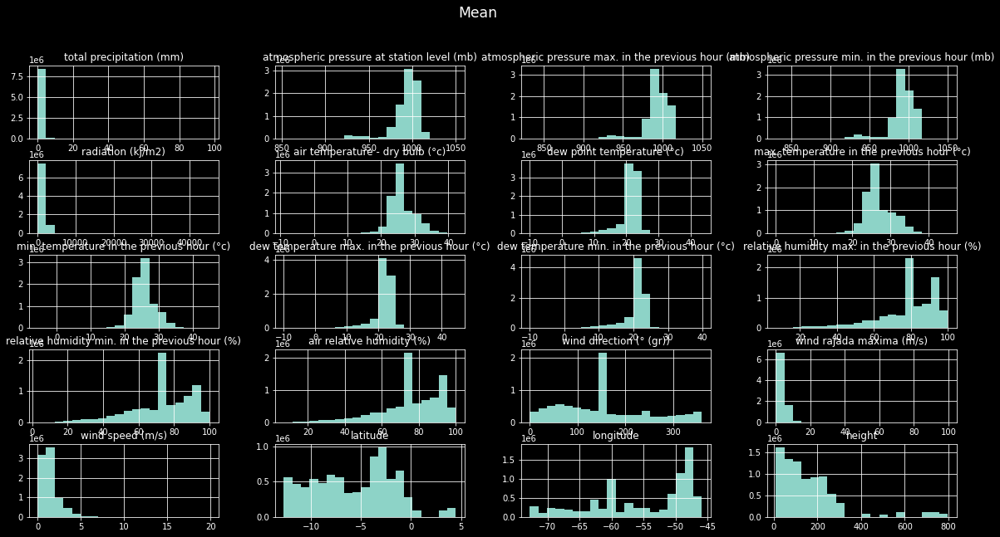

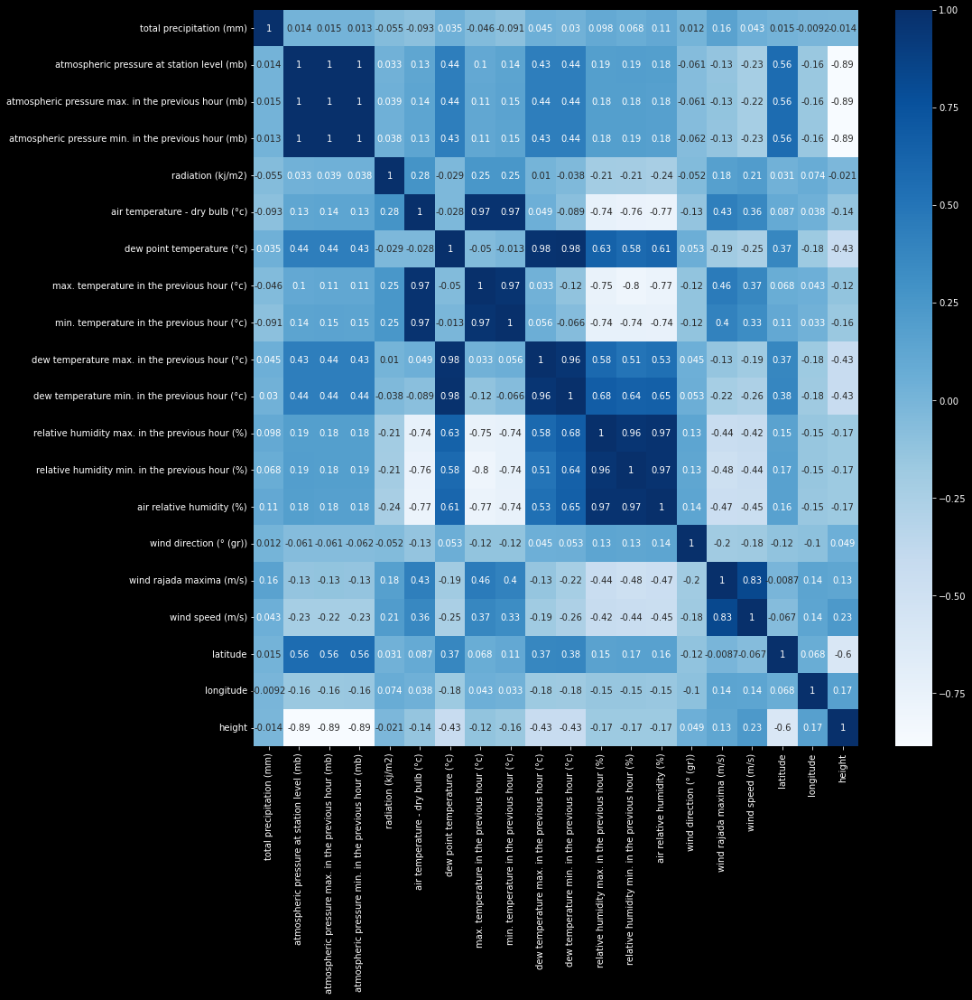

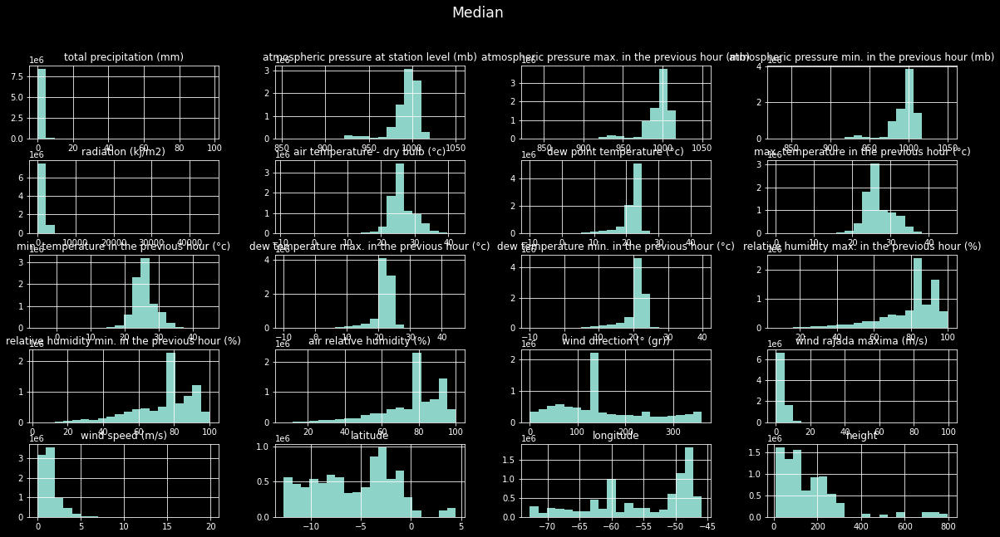

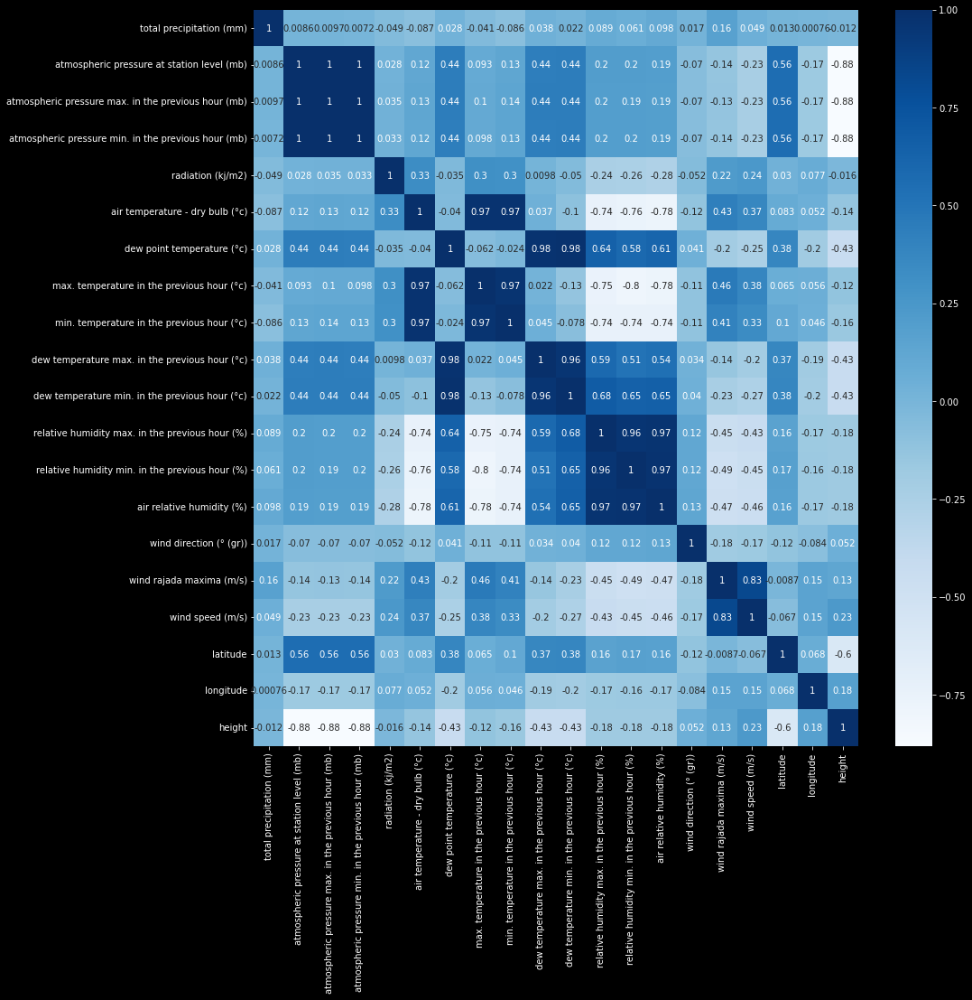

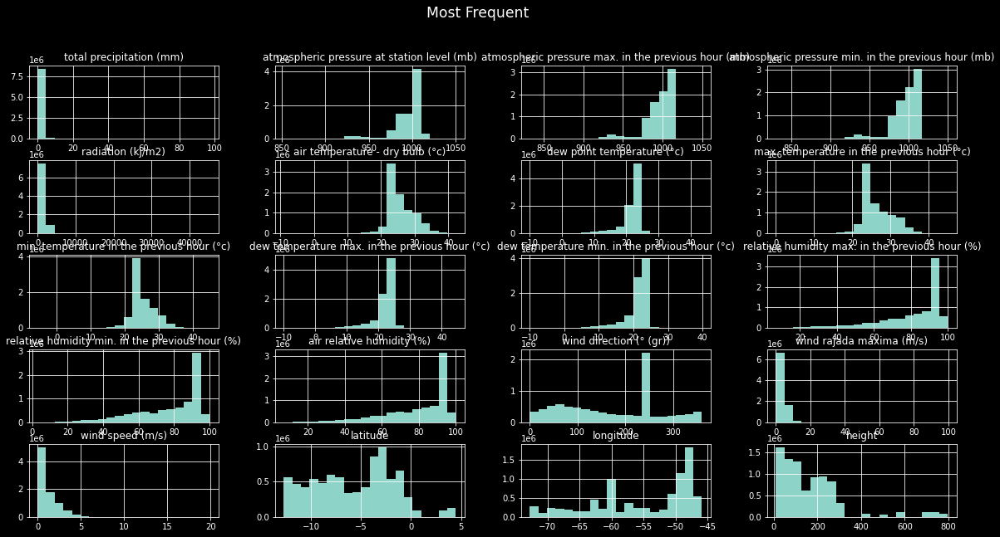

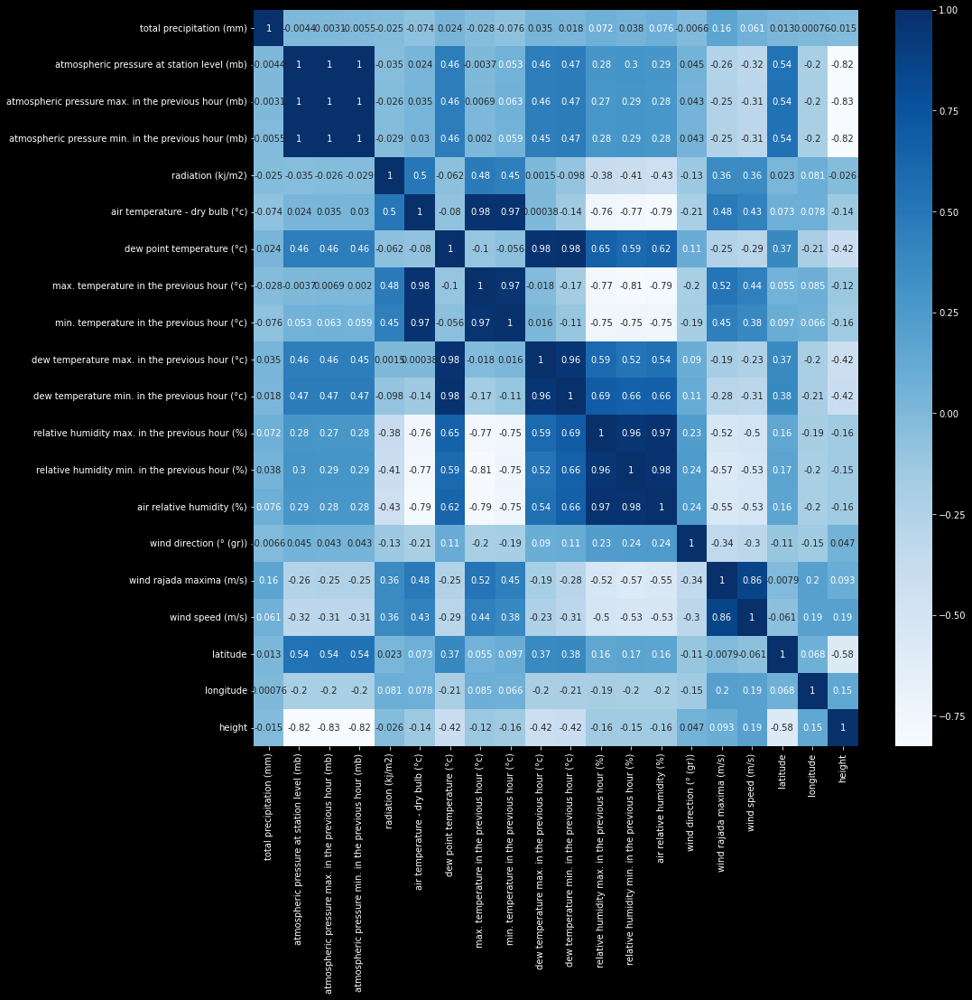

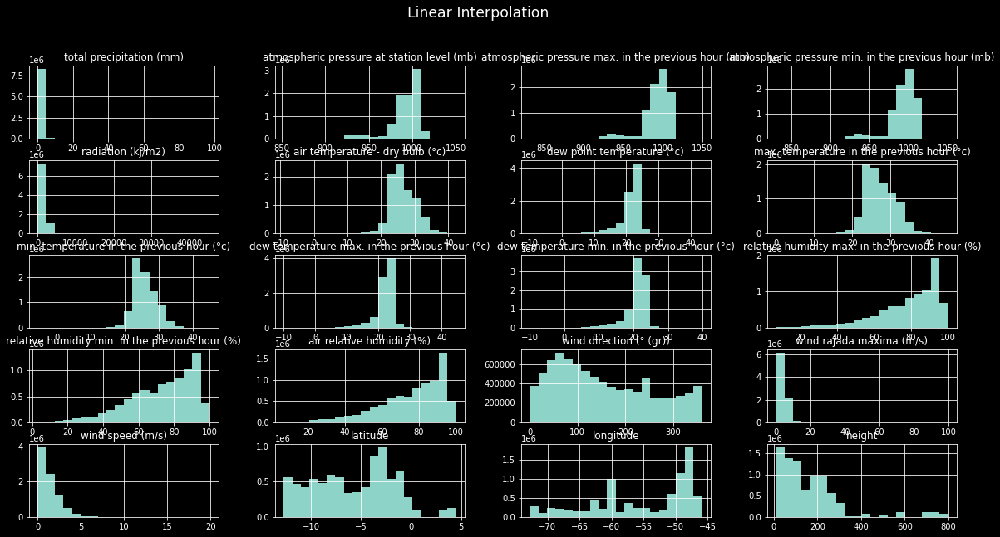

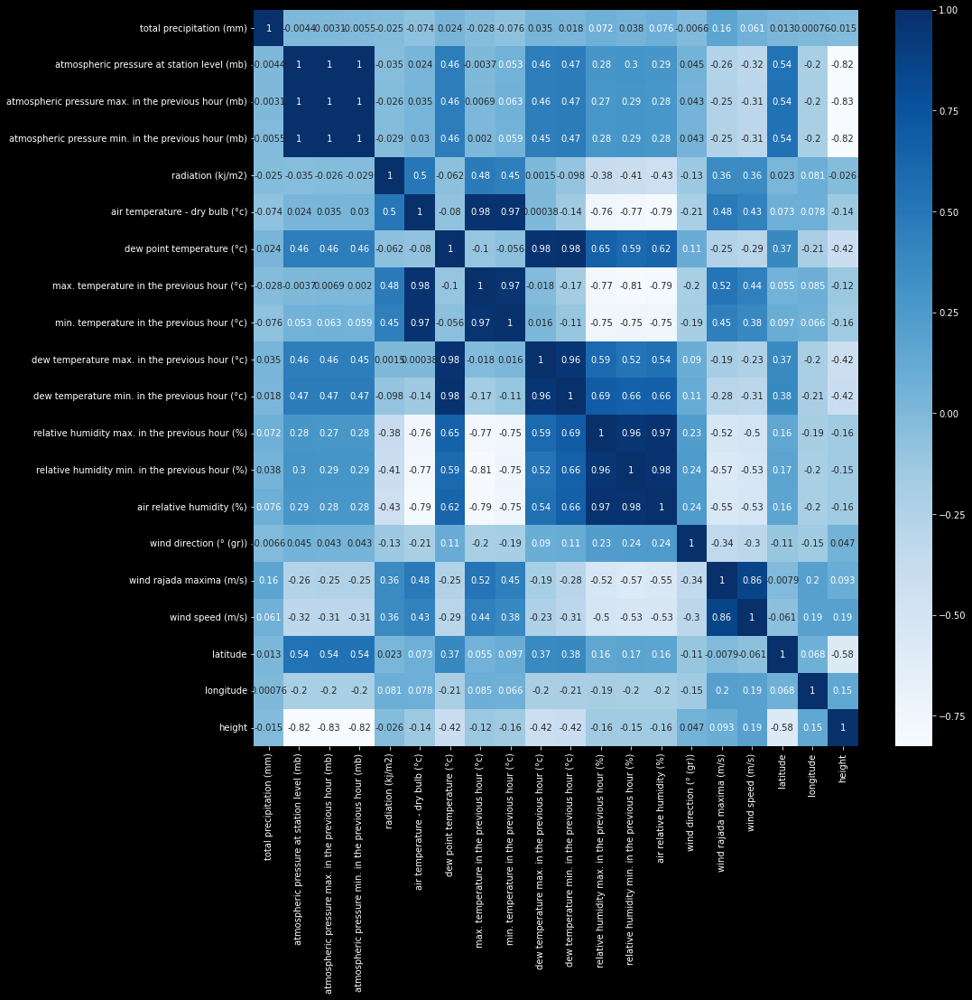

In [6]:
# Mencoba membandingkan hasil korelasi dan distribusi dari beberapa jenis alternatif imputasi.
from sklearn.impute import SimpleImputer
import seaborn as sb

dfd = df.drop(columns=["station_code"])
imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
imputed = imp_mean.fit_transform(dfd)
pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).hist(bins=20)
plt.suptitle("Mean", size="xx-large")
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches
sb.heatmap(pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).corr(), cmap="Blues", annot=True)

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
imputed = imp_median.fit_transform(dfd)
pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).hist(bins=20)
plt.suptitle("Median", size="xx-large")
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches
sb.heatmap(pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).corr(), cmap="Blues", annot=True)

imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imputed = imp_mode.fit_transform(dfd)
pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).hist(bins=20)
plt.suptitle("Most Frequent", size="xx-large")
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches
sb.heatmap(pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).corr(), cmap="Blues", annot=True)

dfd.interpolate('linear').hist(bins=20)
plt.suptitle("Linear Interpolation", size="xx-large")
fig, ax = plt.subplots(figsize=(15,15))         # Sample figsize in inches
sb.heatmap(pd.DataFrame(imputed, index=dfd.index, columns=dfd.columns).corr(), cmap="Blues", annot=True)
plt.show()

### Visualisasi diatas menunjukkan linear interpolation merupakan metode imputasi yang terbaik.

/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


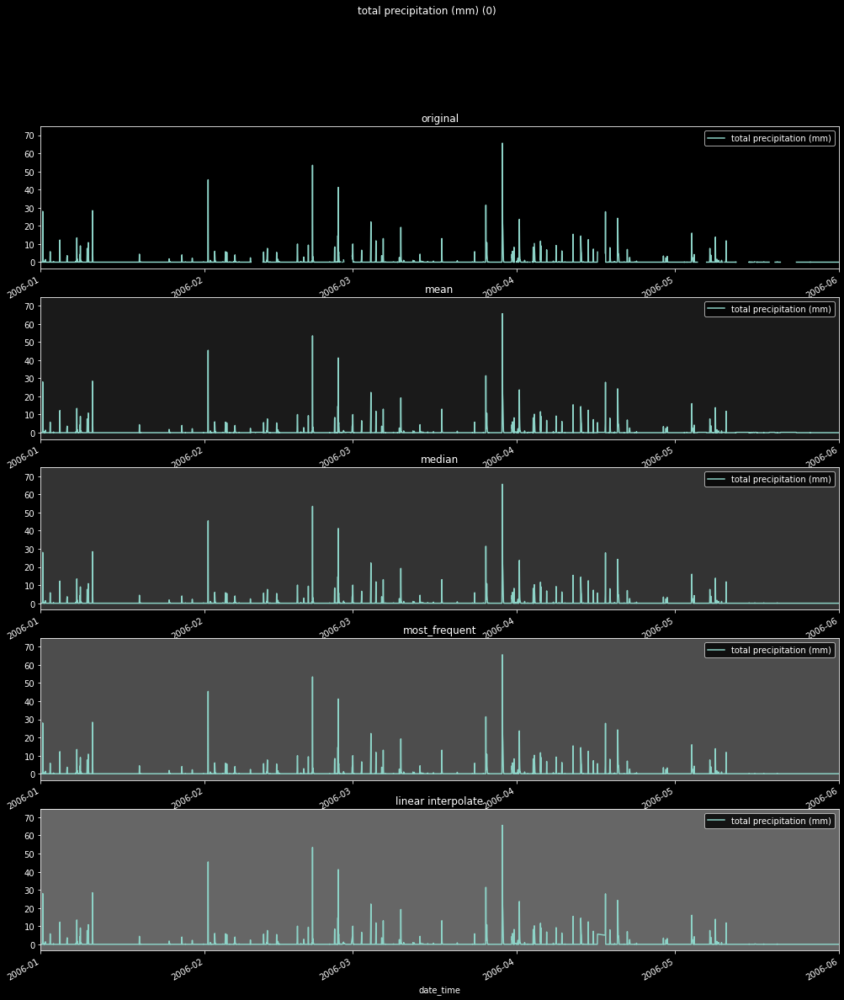

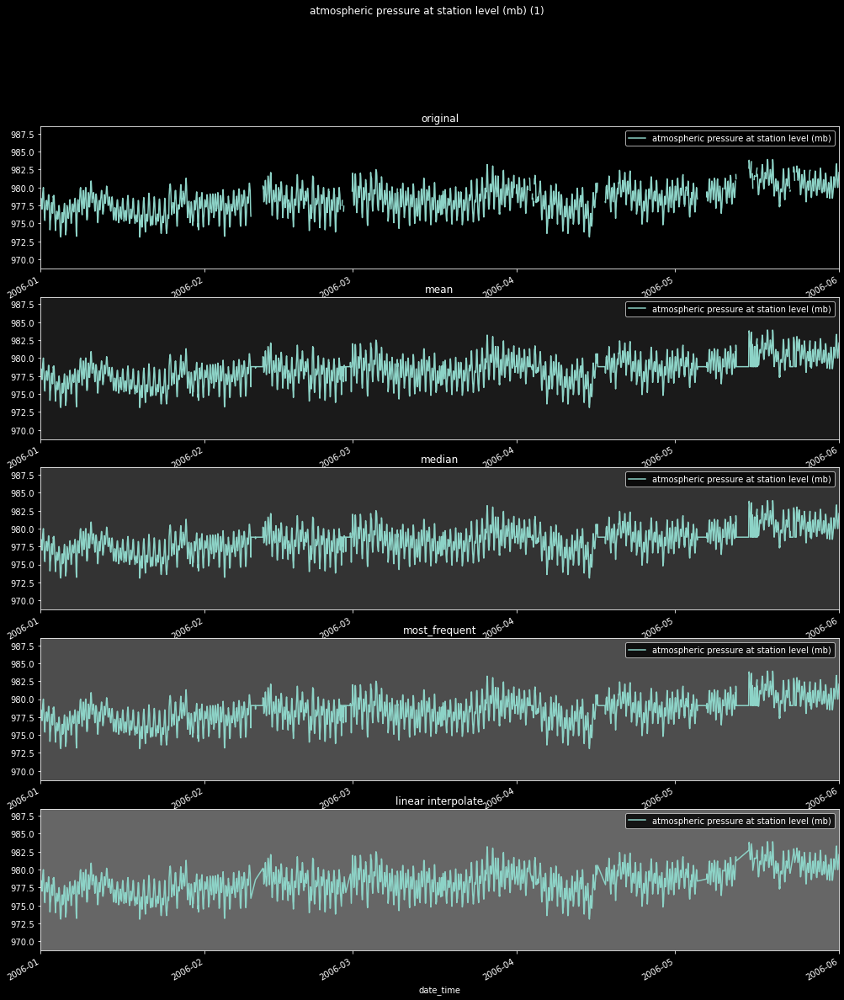

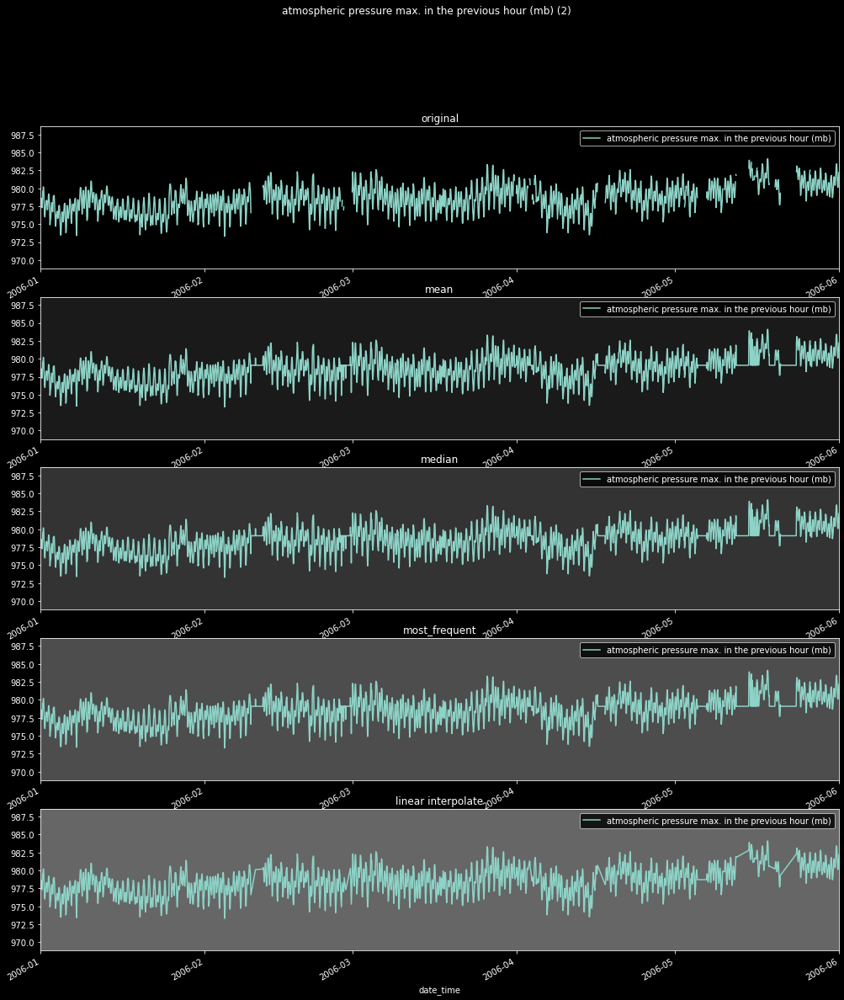

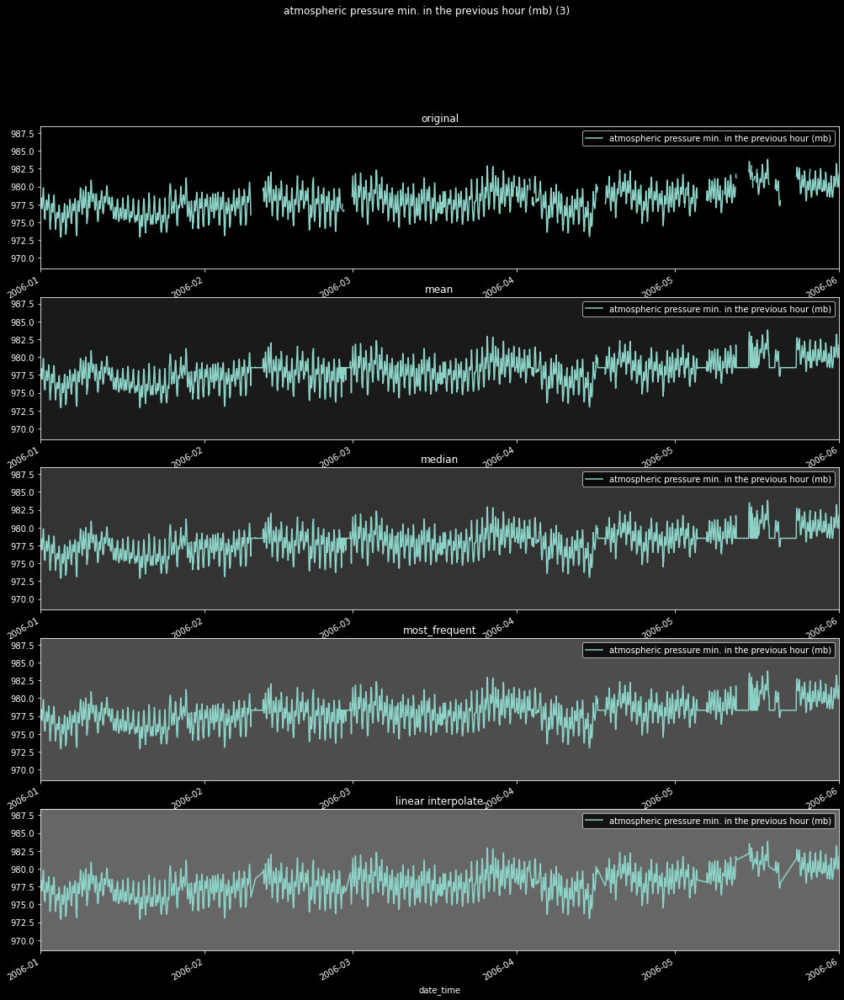

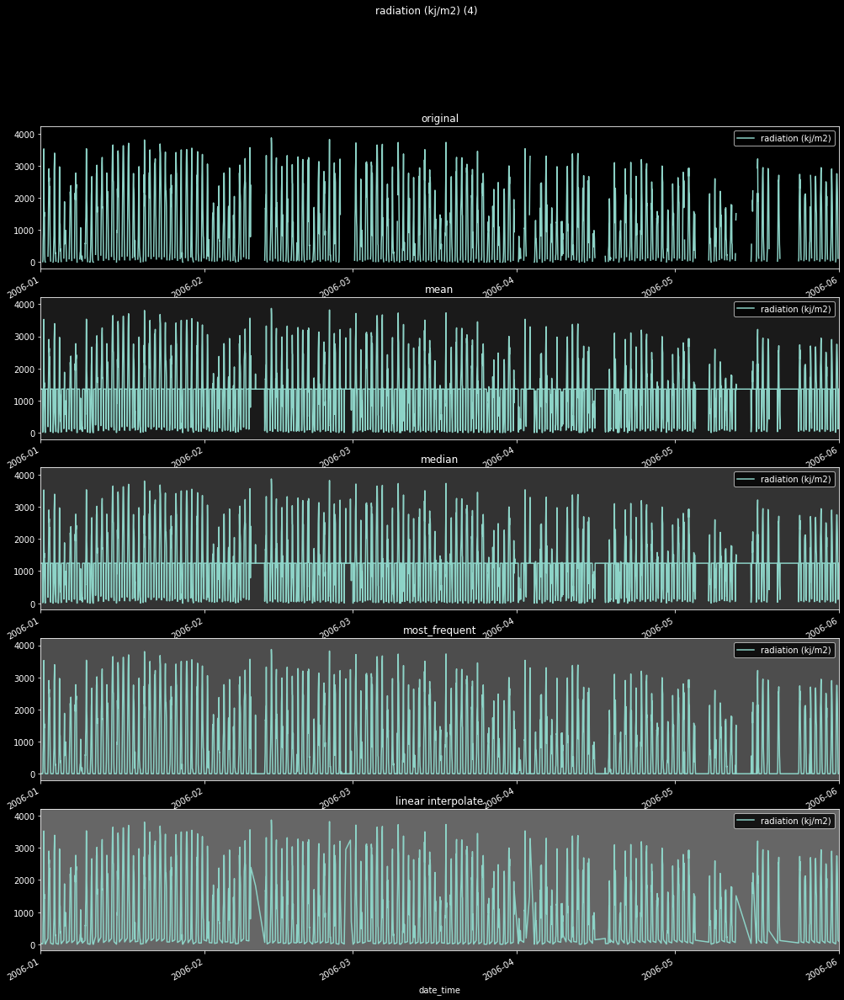

...

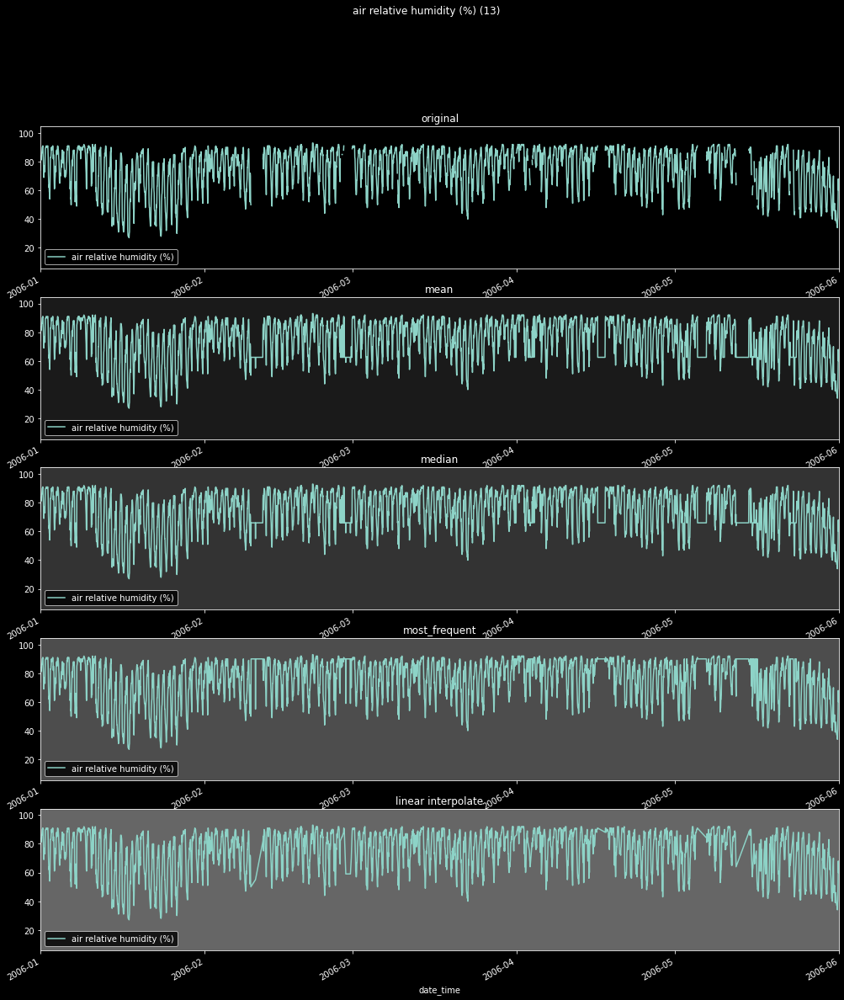

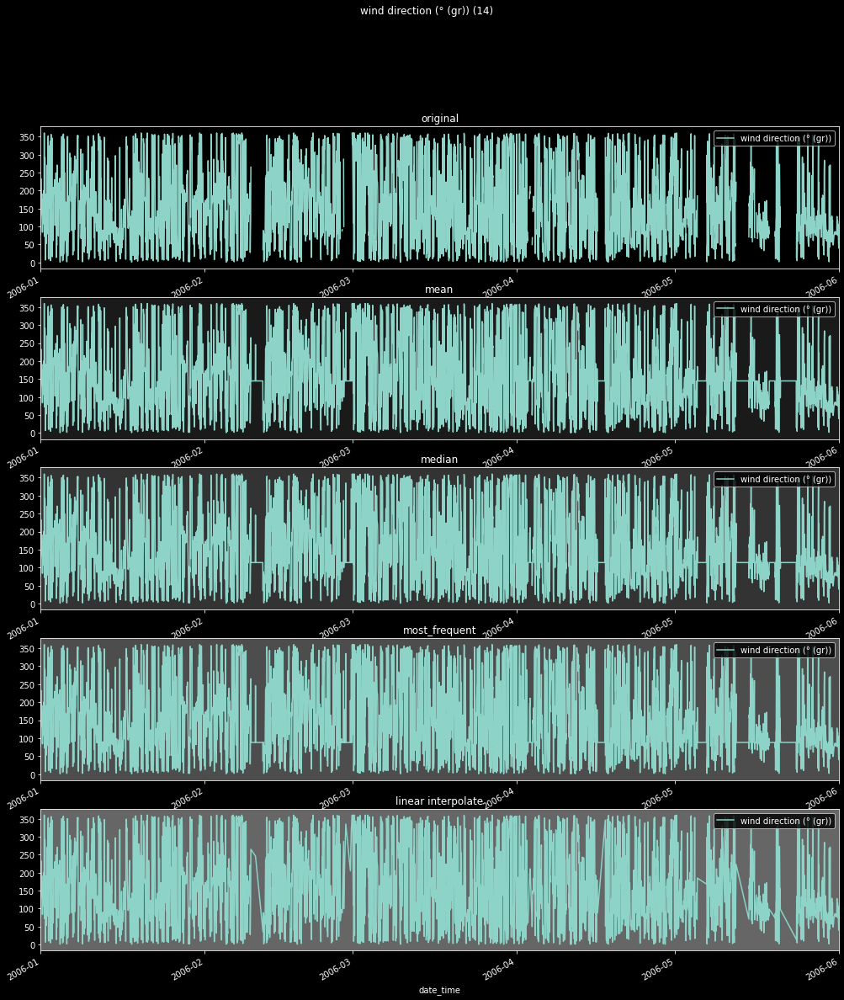

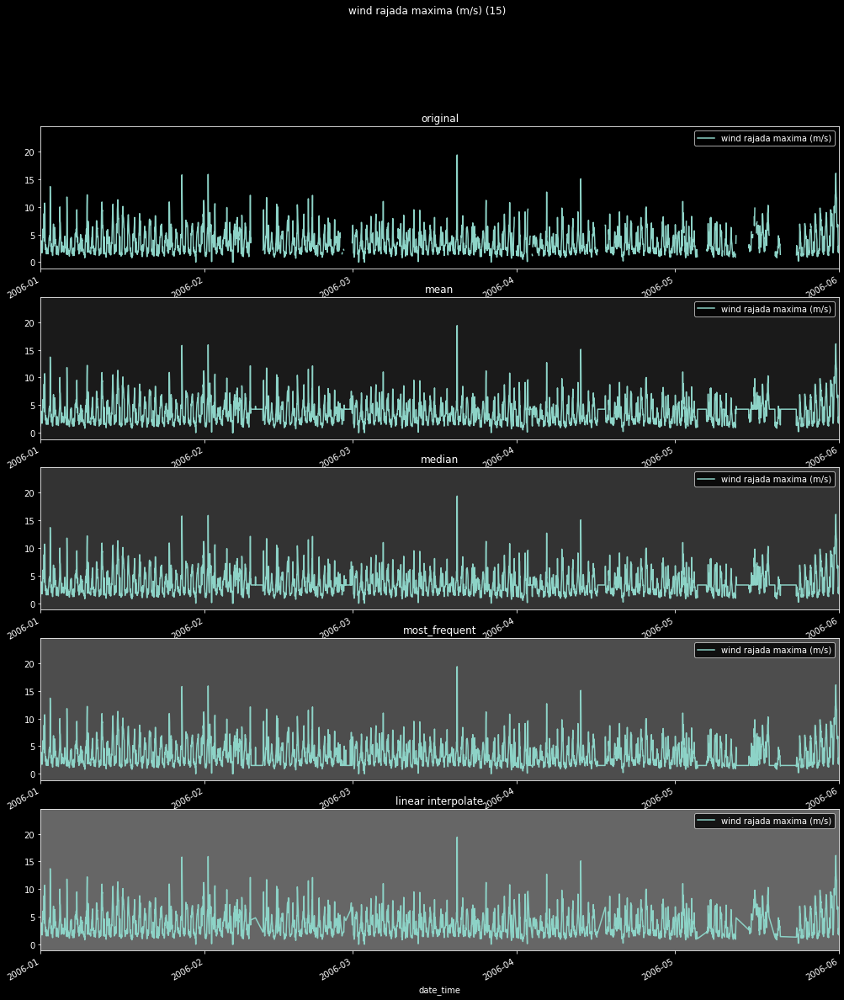

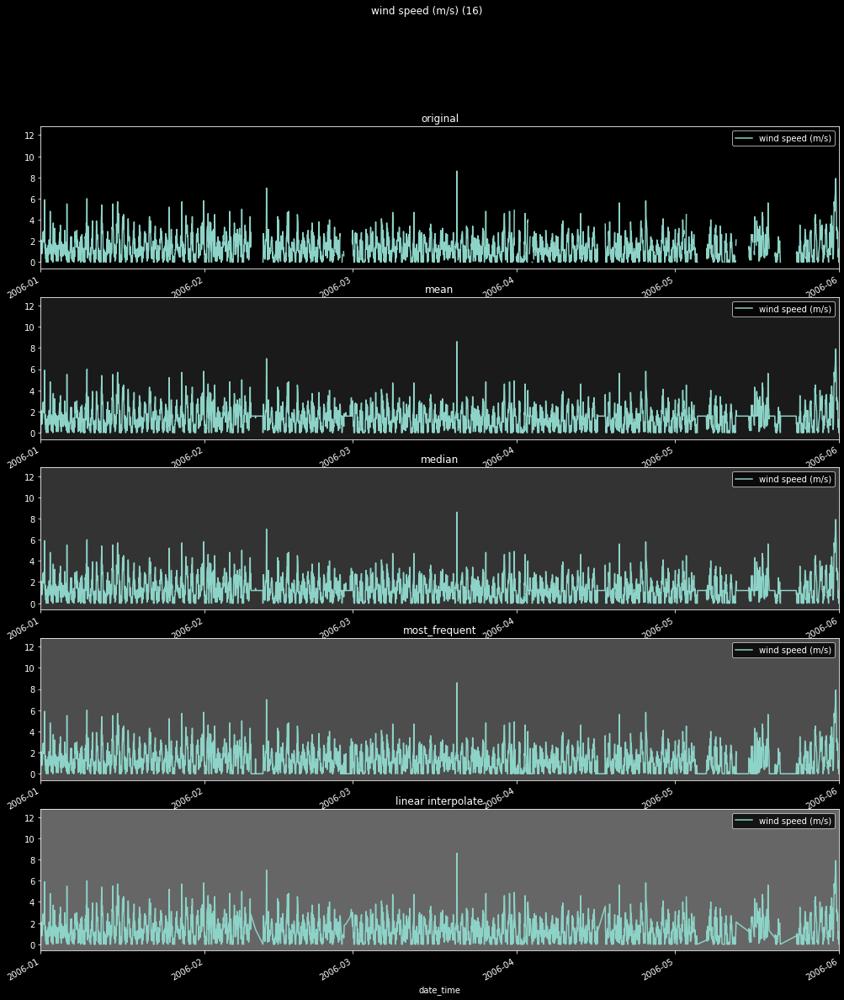

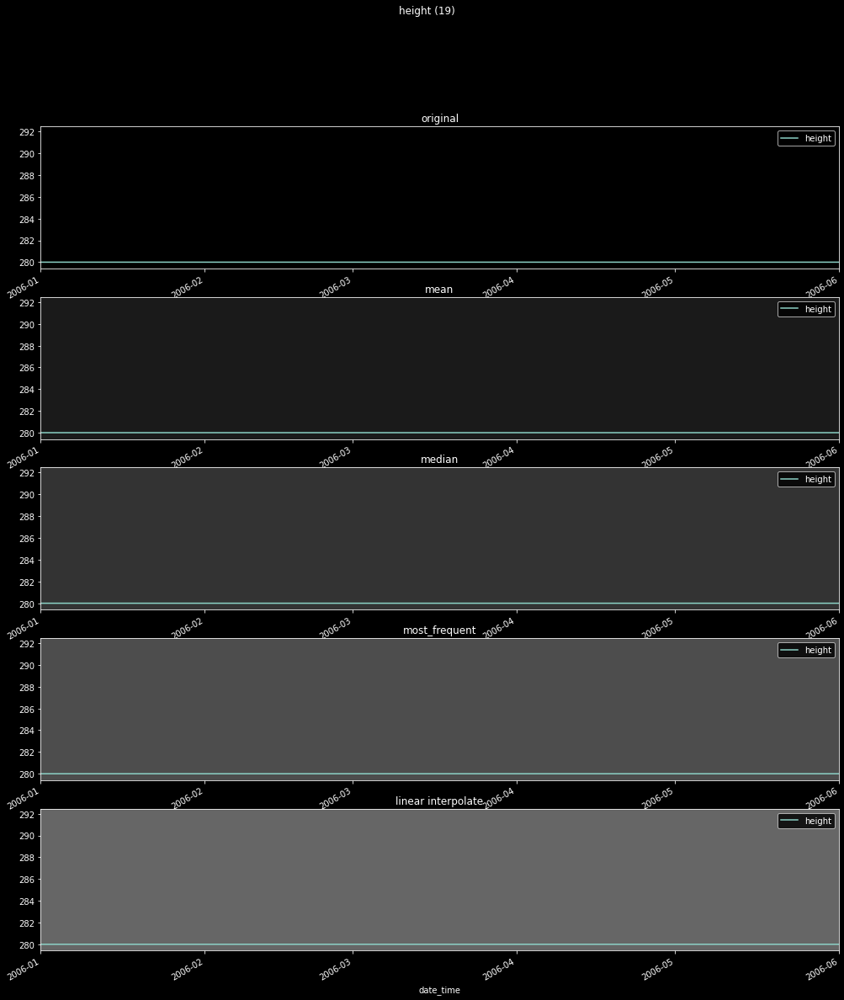

In [7]:
# Mencoba Beberapa Strategi Imputasi Deta pada data dalam range 6 bulan
import datetime
from sklearn.impute import SimpleImputer

year = 2006
station1 = df[df.station_code == "A009"]
station1.drop(columns=["station_code"], inplace=True)

imp_mean = SimpleImputer(missing_values=np.nan, strategy='mean')
imputed = imp_mean.fit_transform(station1)
a = pd.DataFrame(imputed, index=station1.index, columns=station1.columns)

imp_median = SimpleImputer(missing_values=np.nan, strategy='median')
imputed = imp_median.fit_transform(station1)
b = pd.DataFrame(imputed, index=station1.index, columns=station1.columns)

imp_mode = SimpleImputer(missing_values=np.nan, strategy='most_frequent')
imputed = imp_mode.fit_transform(station1)
c = pd.DataFrame(imputed, index=station1.index, columns=station1.columns)

d = station1.interpolate('linear')

for x, i in enumerate(station1.columns):
    if x in [17,18]:
        continue
    fig, axes = plt.subplots(nrows=5, ncols=1, figsize=(17, 20))

    station1.plot(y=i, use_index=True, ax=axes[0])
    axes[0].set_xlim([datetime.date(year, 1, 1), datetime.date(year, 6, 1)])
    axes[0].set_title("original")

    a.plot(y=i, use_index=True, ax=axes[1])
    axes[1].set_xlim([datetime.date(year, 1, 1), datetime.date(year, 6, 1)])   
    axes[1].set_facecolor((0.1, 0.1, 0.1))
    axes[1].set_title("mean")

    b.plot(y=i, use_index=True, ax=axes[2])
    axes[2].set_xlim([datetime.date(year, 1, 1), datetime.date(year, 6, 1)])
    axes[2].set_facecolor((0.2, 0.2, 0.2))
    axes[2].set_title("median")

    c.plot(y=i, use_index=True, ax=axes[3])
    axes[3].set_xlim([datetime.date(year, 1, 1), datetime.date(year, 6, 1)])
    axes[3].set_facecolor((0.3, 0.3, 0.3))
    axes[3].set_title("most_frequent")

    d.plot(y=i, use_index=True, ax=axes[4])
    axes[4].set_xlim([datetime.date(year, 1, 1), datetime.date(year, 6, 1)])
    axes[4].set_facecolor((0.4, 0.4, 0.4))
    axes[4].set_title("linear interpolate")

    plt.suptitle(f"{i} ({x})")
    plt.show()


### Dari visualisasi diatas didapati strategi imputasi yang terbaik untuk beberapa kolom adalah sebagai berikut

In [8]:
most_freq = [0, 4, 16]
interpolate = [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15]
mean = [14, 20]

for i in range(21):
    if i in mean:
        df.iloc[:, i] = SimpleImputer(missing_values=np.nan, strategy='mean').fit_transform(df.iloc[:, i].values.reshape(-1, 1))
    elif i in most_freq:
        df.iloc[:, i] = SimpleImputer(missing_values=np.nan, strategy='most_frequent').fit_transform(df.iloc[:, i].values.reshape(-1, 1))
    elif i in interpolate:
        df.iloc[:, i] = df.iloc[:, i].interpolate('linear')
df.isnull().sum()

total precipitation (mm)                               0
atmospheric pressure at station level (mb)             0
atmospheric pressure max. in the previous hour (mb)    0
atmospheric pressure min. in the previous hour (mb)    0
radiation (kj/m2)                                      0
air temperature - dry bulb (°c)                        0
dew point temperature (°c)                             0
max. temperature in the previous hour (°c)             0
min. temperature in the previous hour (°c)             0
dew temperature max. in the previous hour (°c)         0
dew temperature min. in the previous hour (°c)         0
relative humidity max. in the previous hour (%)        0
relative humidity min. in the previous hour (%)        0
air relative humidity (%)                              0
wind direction (° (gr))                                0
wind rajada maxima (m/s)                               0
wind speed (m/s)                                       0
station_code                   

### Visualisasi data setelah dilakukan imputasi data


/opt/conda/lib/python3.7/site-packages/pandas/core/frame.py:4913: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  errors=errors,


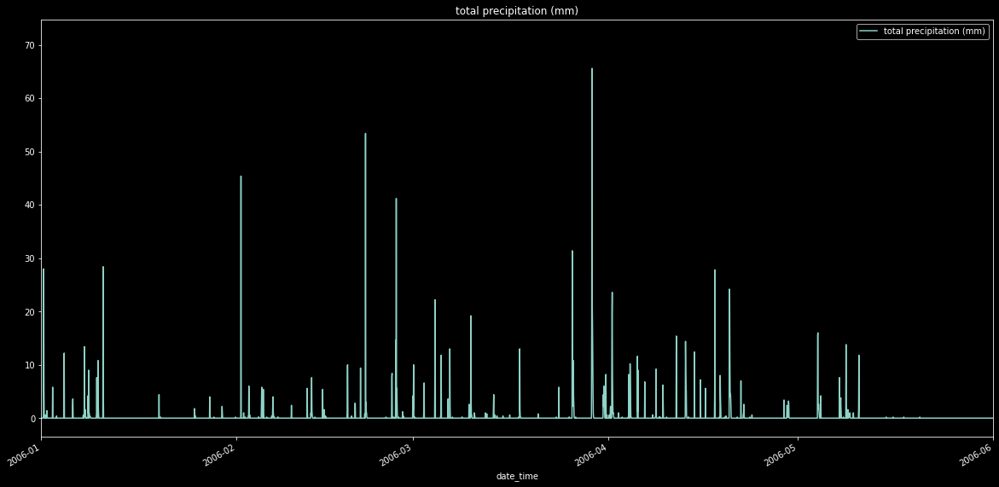

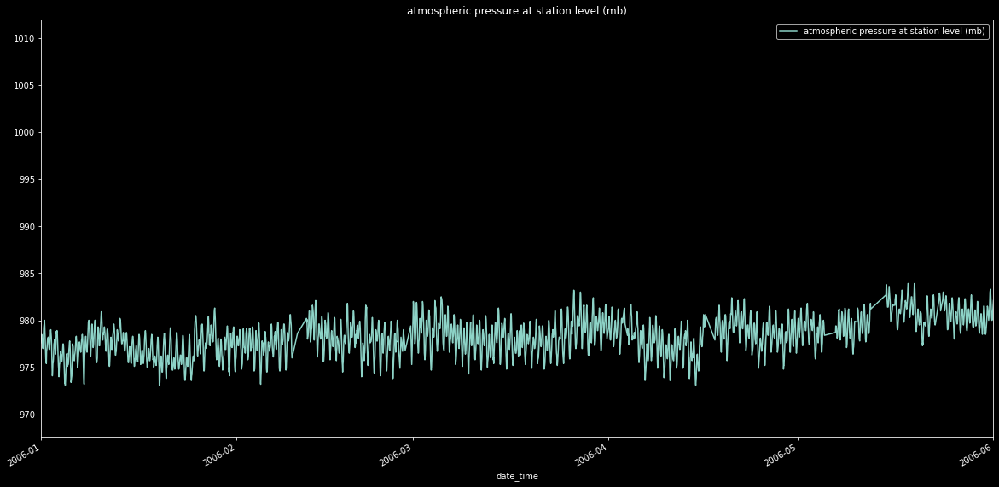

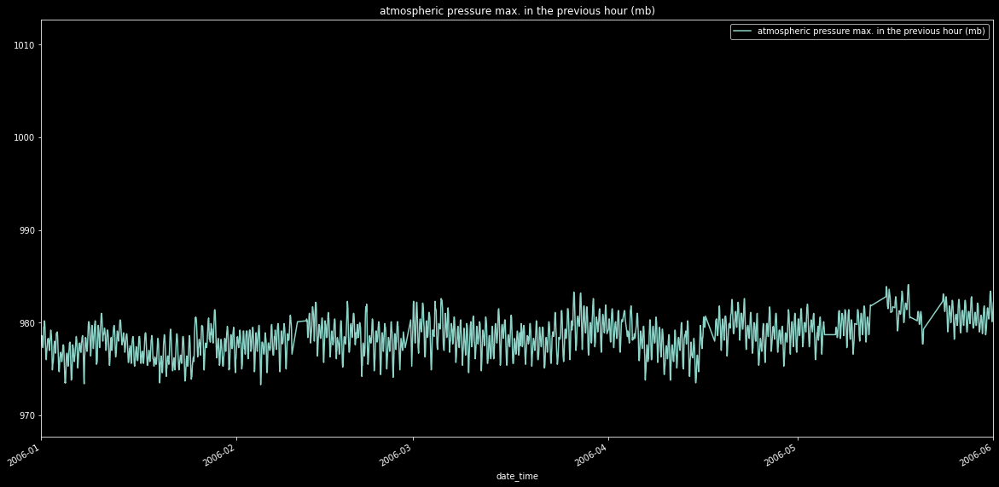

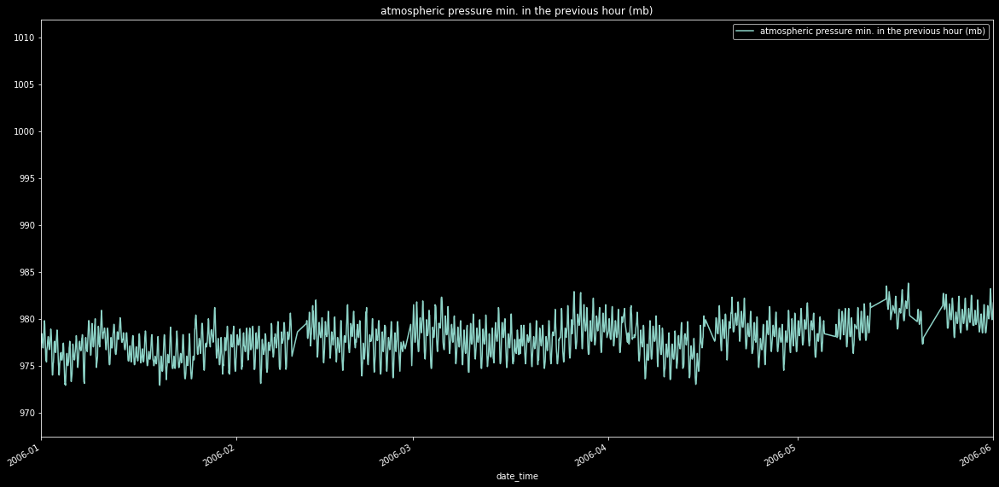

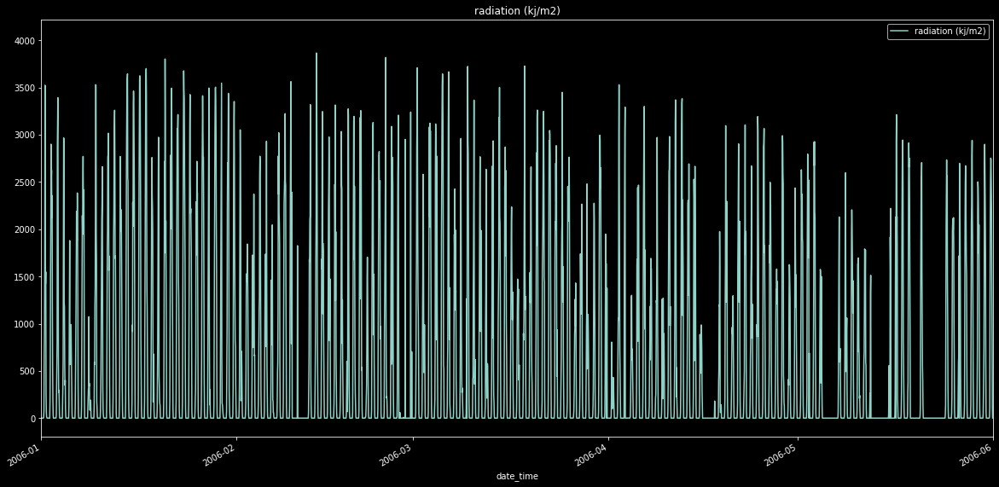

...

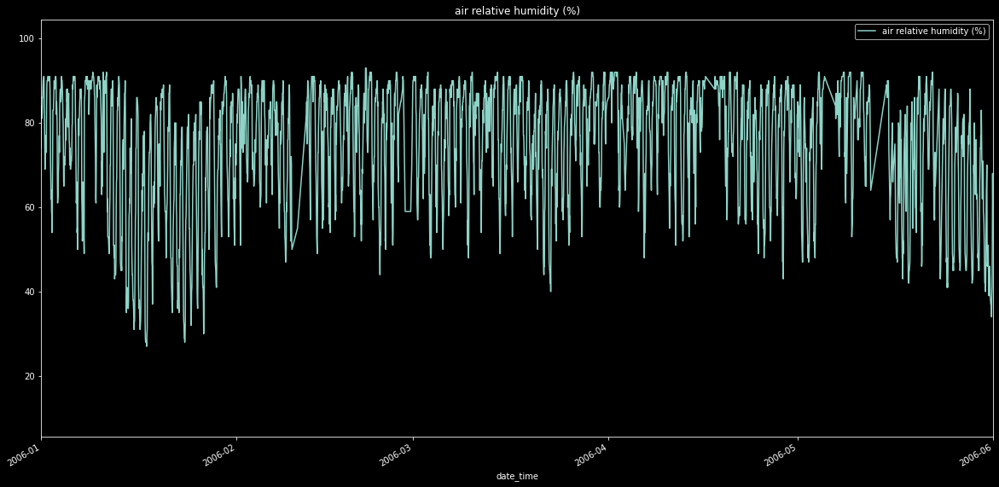

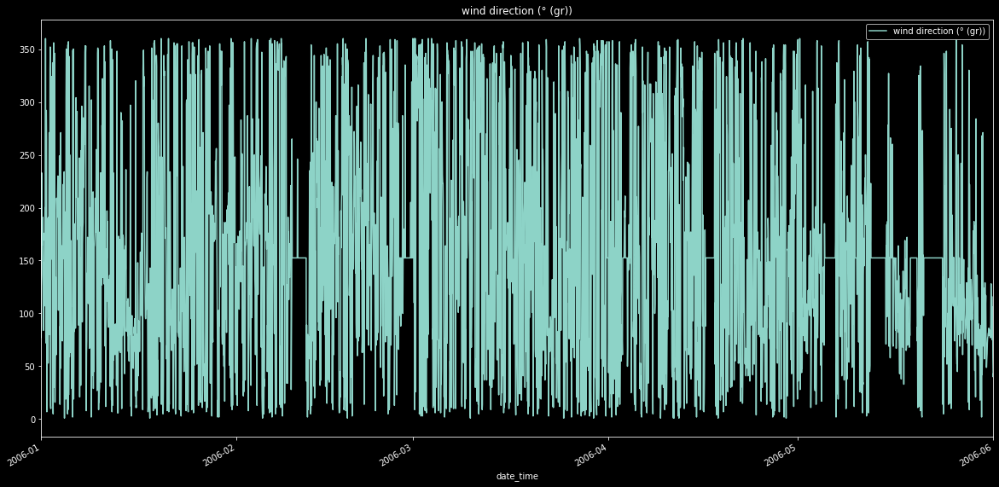

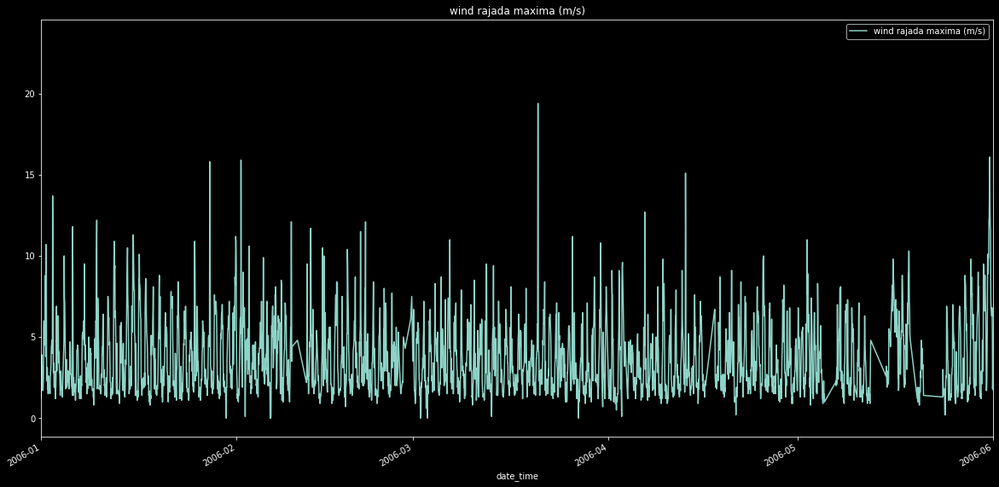

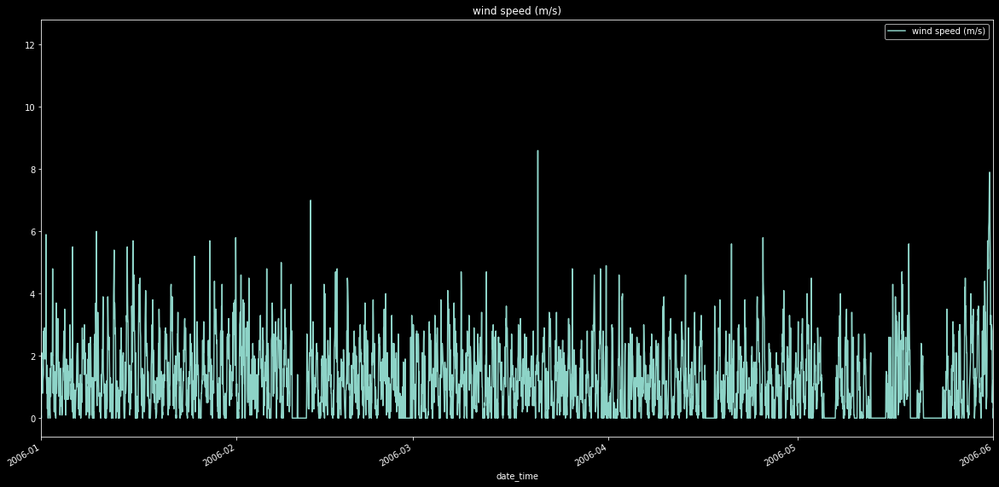

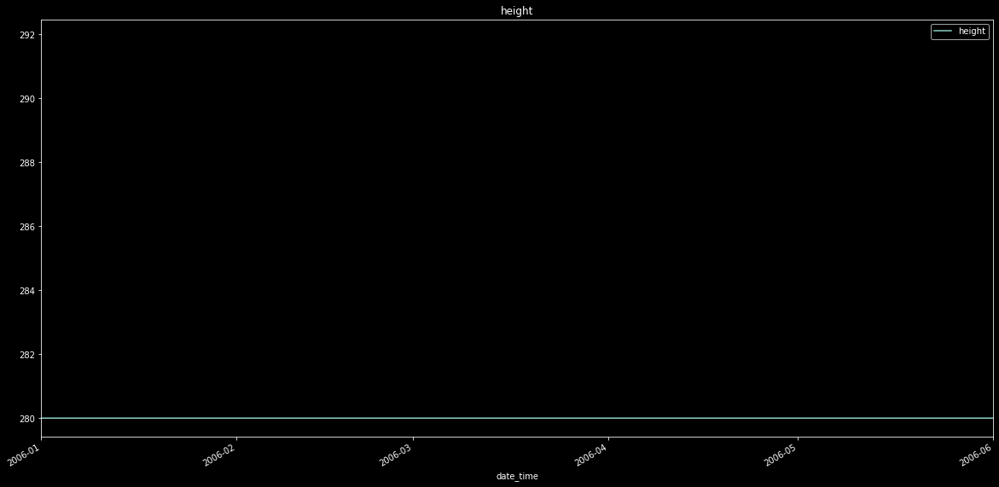

In [9]:
year = 2006
station1 = df[df.station_code == "A009"]
station1.drop(columns=["station_code"], inplace=True)

for x, i in enumerate(station1.columns):
    if x in [17,18]:
        continue
    station1.plot(y=i, use_index=True)
    plt.xlim([datetime.date(year, 1, 1), datetime.date(year, 6, 1)])
    plt.title(i)
    plt.show()


## Remove Outliers

In [10]:
from numpy import percentile
df.reset_index(inplace= True)

removed_rows = set()
for i in range(df.shape[1]):
    if df.iloc[:, i].dtype == 'float64':
        if df.columns[i] == "total precipitation (mm)":
            continue # skip total precipitation agar tidak tersisa nilai 0 saja
        q25, q75 = percentile(df.iloc[:, i], 25), percentile(df.iloc[:, i], 75)
        iqr = q75 - q25
        cut_off = iqr * 1.5
        lower, upper = q25 - cut_off, q75 + cut_off
        outliers = df.index[(df.iloc[:, i] < lower) | (df.iloc[:, i] > upper)].tolist()
        removed_rows.update(outliers)
        print(df.columns[i], "\t number of outliers:", len(outliers))

atmospheric pressure at station level (mb) 	 number of outliers: 476007
atmospheric pressure max. in the previous hour (mb) 	 number of outliers: 477636
atmospheric pressure min. in the previous hour (mb) 	 number of outliers: 476634
radiation (kj/m2) 	 number of outliers: 820635
air temperature - dry bulb (°c) 	 number of outliers: 45457
dew point temperature (°c) 	 number of outliers: 792057
max. temperature in the previous hour (°c) 	 number of outliers: 31828
min. temperature in the previous hour (°c) 	 number of outliers: 101778
dew temperature max. in the previous hour (°c) 	 number of outliers: 806227
dew temperature min. in the previous hour (°c) 	 number of outliers: 788537
relative humidity max. in the previous hour (%) 	 number of outliers: 251419
relative humidity min. in the previous hour (%) 	 number of outliers: 46054
air relative humidity (%) 	 number of outliers: 146533
wind direction (° (gr)) 	 number of outliers: 0
wind rajada maxima (m/s) 	 number of outliers: 15790

In [11]:
df.drop(removed_rows, inplace= True)
df.shape

(6371783, 22)

## Visualisasi Setelah Preprocess

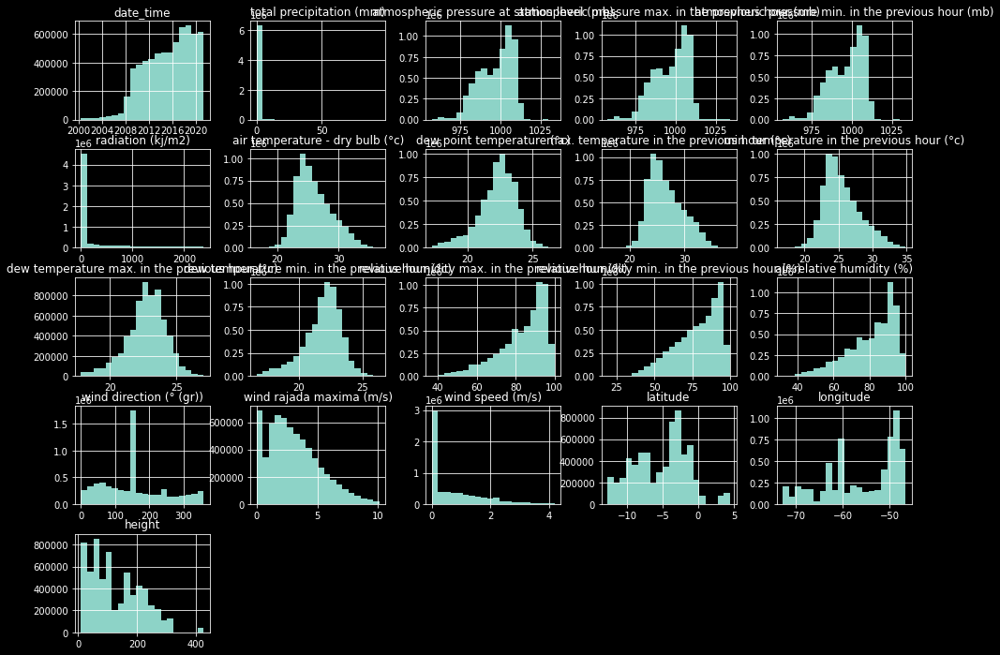

In [12]:
df.hist(figsize=(16,12), bins=20)
plt.show()

## Bandingkan Semua Dataset

In [13]:
def preprocess(csv):
    # remove index
    df = pd.read_csv('../input/hourly-weather-surface-brazil-southeast-region/' + csv).iloc[:, 1:]
    # rename columns
    renamed_columns_en = ['date','hour','total precipitation (mm)', 'atmospheric pressure at station level (mb)','atmospheric pressure max. in the previous hour (mb)','atmospheric pressure min. in the previous hour (mb)','radiation (kj/m2)','air temperature - dry bulb (°c)','dew point temperature (°c)','max. temperature in the previous hour (°c)','min. temperature in the previous hour (°c)','dew temperature max. in the previous hour (°c)','dew temperature min. in the previous hour (°c)','relative humidity max. in the previous hour (%)','relative humidity min. in the previous hour (%)','air relative humidity (%)','wind direction (° (gr))','wind rajada maxima (m/s)','wind speed (m/s)','region','state','station','station_code','latitude','longitude','height']
    df.columns = renamed_columns_en
    # set date_time column as index
    df['date_time'] = pd.to_datetime(df['date'] + ' ' +  df['hour'])
    df.set_index("date_time", inplace=True)
    # drop unused columns
    df.drop(columns=["region", "state", "station", "date", "hour"], inplace=True)
    
    # Menandainya -9999 sebagai data missing
    df.replace(-9999.0, np.nan, inplace=True)
    
    # Plot sebelum data preprocess
    df.hist(bins=20)
    plt.suptitle("Before", size="xx-large")
    
    # Impute dengan beberapa strategy
    most_freq = [0, 4, 16]
    interpolate = [1, 2, 3, 5, 6, 7, 8, 9, 10, 11, 12, 13, 15]
    mean = [14, 20]

    for i in range(21):
        if i in mean:
            df.iloc[:, i] = SimpleImputer(missing_values=np.nan, strategy='mean').fit_transform(df.iloc[:, i].values.reshape(-1, 1))
        elif i in most_freq:
            df.iloc[:, i] = SimpleImputer(missing_values=np.nan, strategy='most_frequent').fit_transform(df.iloc[:, i].values.reshape(-1, 1))
        elif i in interpolate:
            df.iloc[:, i] = df.iloc[:, i].interpolate('linear')
    df.isnull().sum()
    
    # Remove outliers
    df.reset_index(inplace= True)
    removed_rows = set()
    for i in range(df.shape[1]):
        if df.iloc[:, i].dtype == 'float64':
            if df.columns[i] == "total precipitation (mm)":
                continue # skip total precipitation agar tidak tersisa nilai 0 saja
            q25, q75 = percentile(df.iloc[:, i], 25), percentile(df.iloc[:, i], 75)
            iqr = q75 - q25
            cut_off = iqr * 1.5
            lower, upper = q25 - cut_off, q75 + cut_off
            outliers = df.index[(df.iloc[:, i] < lower) | (df.iloc[:, i] > upper)].tolist()
            removed_rows.update(outliers)
    print("Number of removed rows:", len(removed_rows))
    df.drop(removed_rows, inplace= True)
    df.set_index("date_time", inplace=True)

    # Plot setelah data preprocess
    df.hist(bins=20)
    plt.suptitle("After", size="xx-large")
    plt.show()


Number of removed rows: 1473402


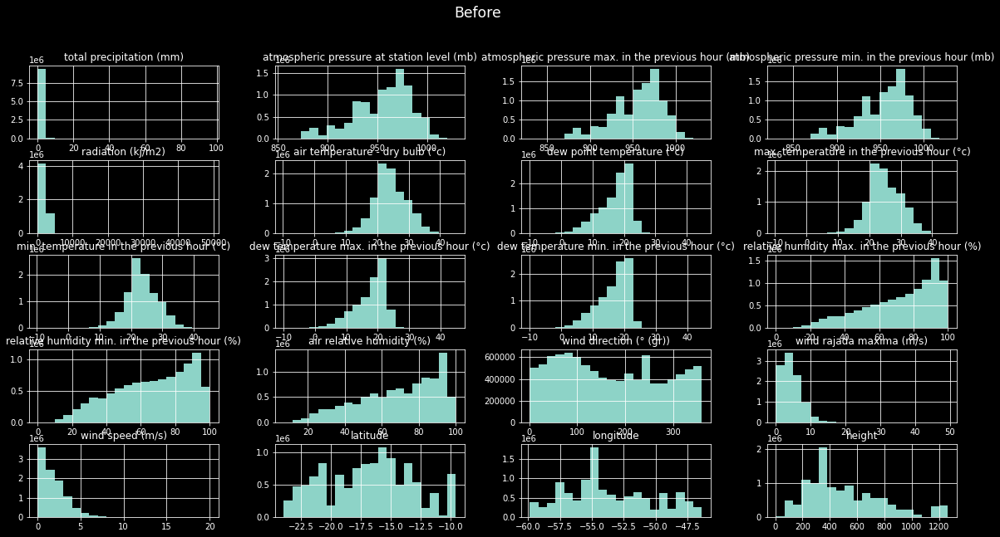

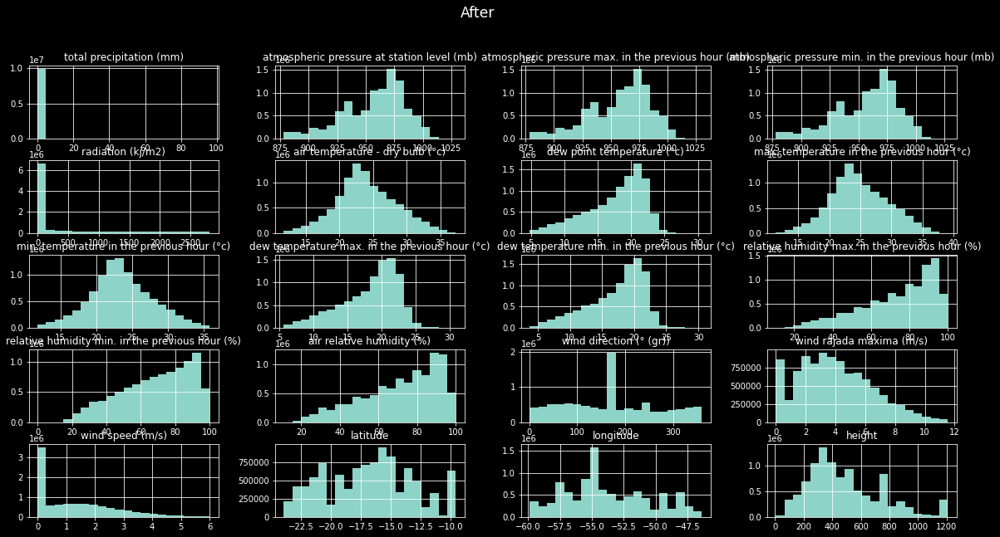

In [14]:
preprocess("central_west.csv")

Number of removed rows: 2312744


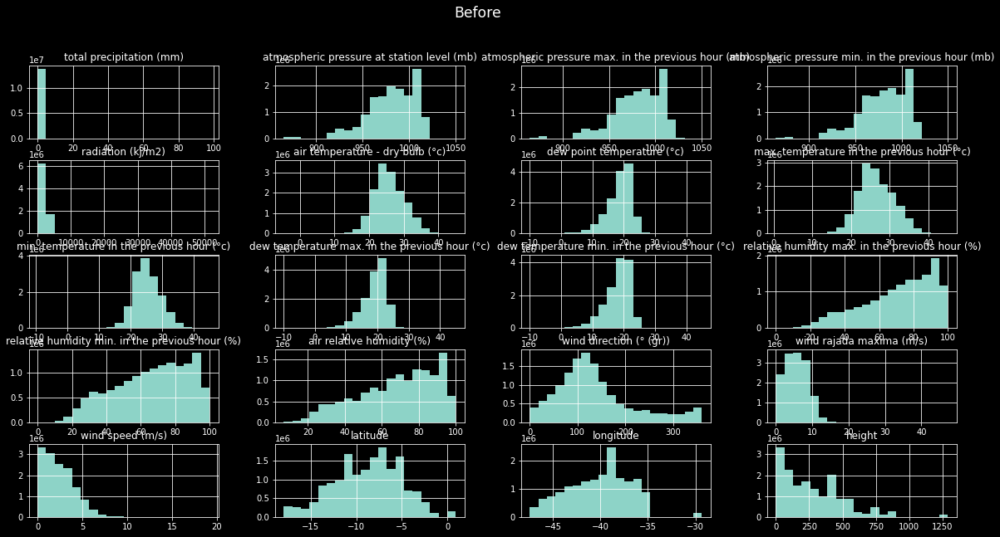

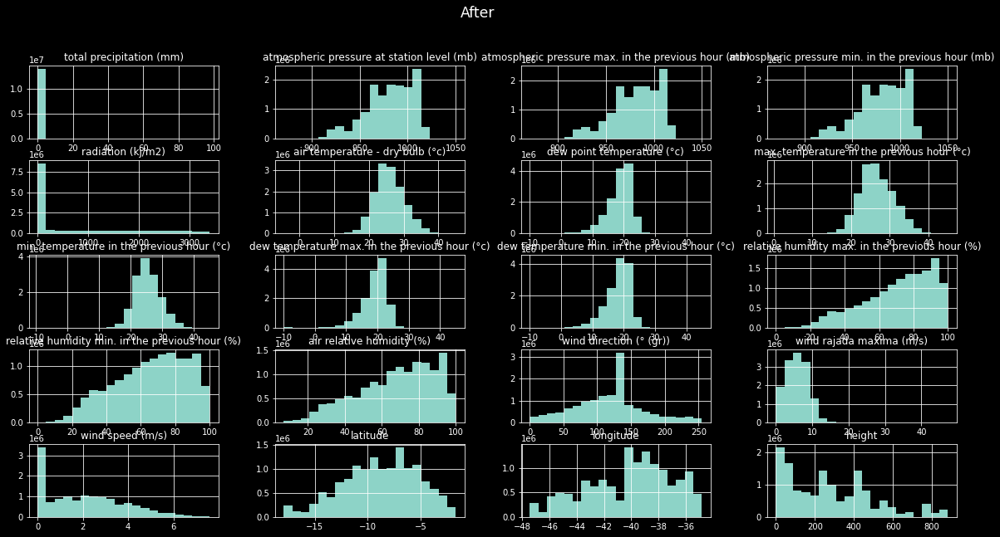

In [15]:
preprocess("northeast.csv")

Number of removed rows: 1040100


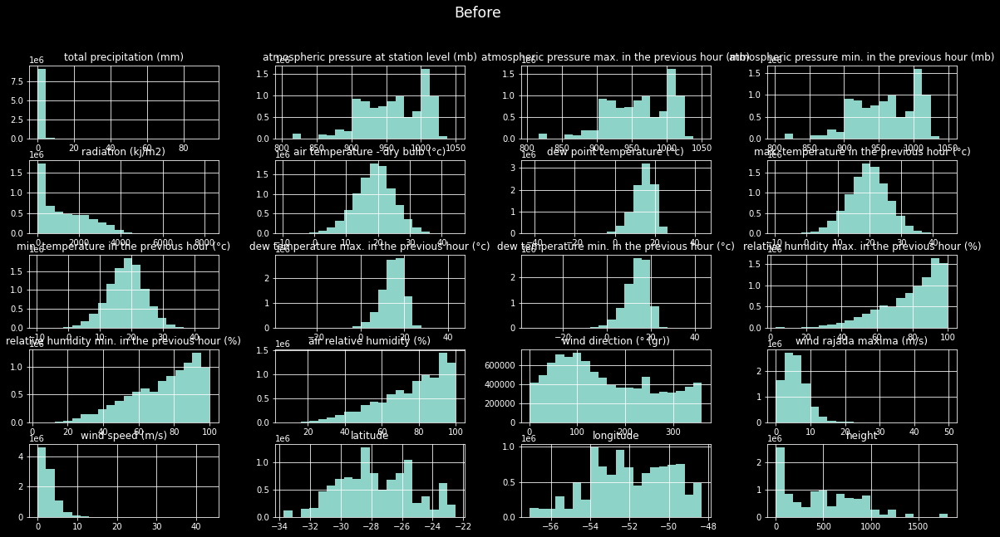

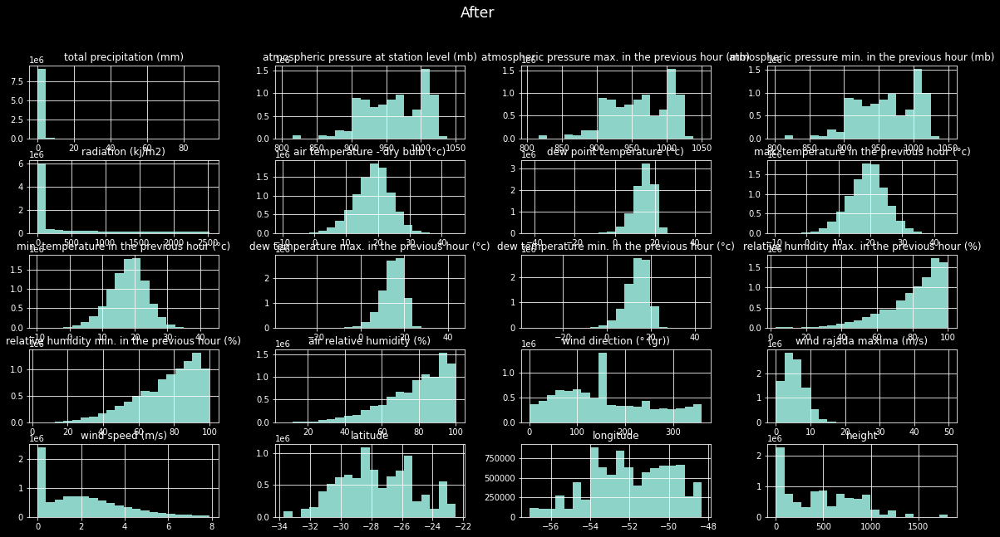

In [16]:
preprocess("south.csv")

Number of removed rows: 1131604


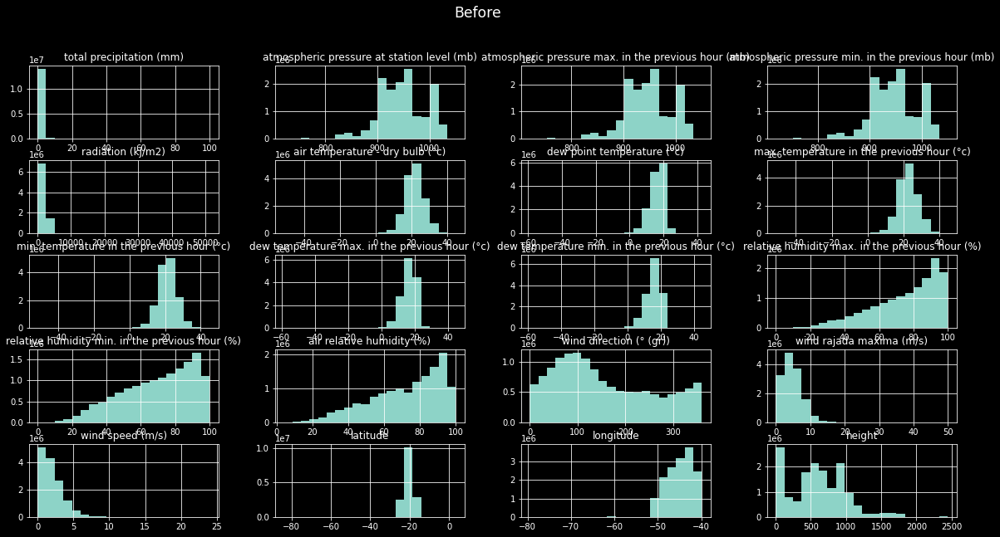

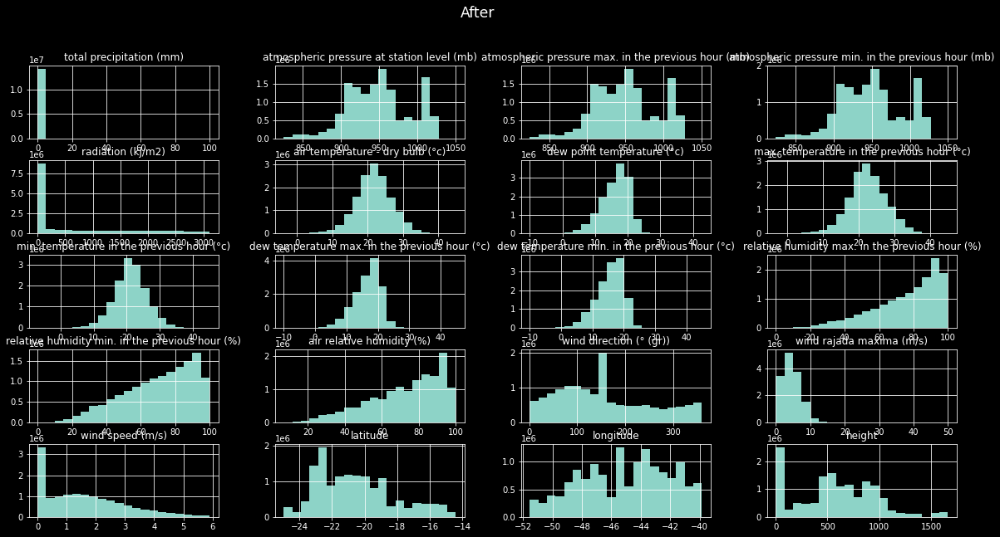

In [17]:
preprocess("southeast.csv")

1. Dari perbandingan beberapa metode imputasi, didapati bahwa metode interpolasi linear adalah yang terbaik dikarenakan dataset adalah data time series. Namun, tidak semua fitur cocok diimpute dengan interpolasi, contohnya seperti wind direction yang sangat fluktuatif, atau precipitation yang lebih cocok menggunakan modus.
2. Metode indentifikasi pencilan yang digunakan adalah metode IQR, karena distribusi data kebanyakan tidak normal.
2. Dari pemrosesan data yang telah dilakukan, terlihat bahwa data yang ada menjadi lebih normal distribusinya.